In [2]:
import sys
sys.path.append(r'C:\Users\Projects')
from treebricks import GalaxyCatalog
import treebricks as tb
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from sklearn.neighbors import NearestNeighbors
from scipy.ndimage import gaussian_filter
from numpy.fft import fftn, ifftn, fftfreq
from sklearn.decomposition import PCA
from scipy.fft import fft, ifft, fftfreq

file_path = r'C:\Users\Projects\tree_bricks970'
gc = GalaxyCatalog(file_path)

nbodies: [337682774] mpart: [8.59259648e-08] aexp: [0.82587326] omega_t: [0.39877856] age: [11.21741055] nsub: [1186 4248] nmax: 5434
Reading galaxies took 17.34 secs.
Total time was 17.34 secs.


In [3]:
galaxies = [g for g in gc.treebricks_dict['galaxies'] if 'mass' in g and 'px' in g]

# Select red dwarf candidates (example: mass < 1e10 Msun)
mass_threshold = 1e10  # adjust as needed
dwarfs = [g for g in galaxies if g['mass'][0] < mass_threshold]

# Pull positions and masses into arrays
positions = np.array([[g['px'], g['py'], g['pz']] for g in dwarfs])
masses = np.array([g['mass'][0] for g in dwarfs])

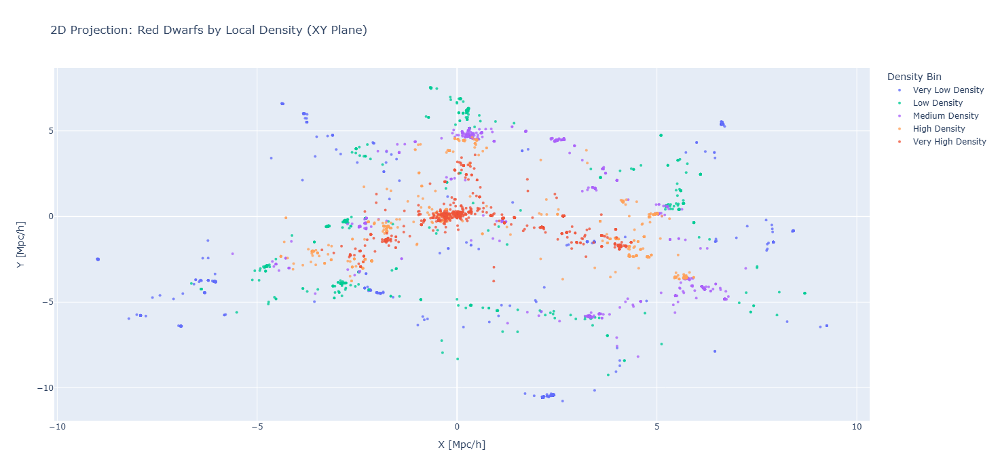

In [6]:
#  Compute Local Densities 
radius = 5.0
nbrs = NearestNeighbors(radius=radius).fit(positions)
density = np.array([len(nbrs.radius_neighbors([pos], return_distance=False)[0]) for pos in positions])

# Bin into 5 quantile-based density levels 
quantiles = np.quantile(density, [0.2, 0.4, 0.6, 0.8])
density_bins = np.digitize(density, quantiles)

#  Prepare 2D projection (XY plane) 
x = positions[:, 0]
y = positions[:, 1]

#  Define labels and colors 
labels = ["Very Low", "Low", "Medium", "High", "Very High"]
colors = ["#636EFA", "#00CC96", "#AB63FA", "#FFA15A", "#EF553B"]

# Create 2D Scatter Plot with Plotly 
fig = go.Figure()

for i in range(5):
    idx = density_bins == i
    fig.add_trace(go.Scatter(
        x=x[idx],
        y=y[idx],
        mode='markers',
        name=f"{labels[i]} Density",
        marker=dict(
            size=4,
            color=colors[i],
            opacity=0.8
        )
    ))

# --- Layout ---
fig.update_layout(
    title='2D Projection: Red Dwarfs by Local Density (XY Plane)',
    xaxis_title='X [Mpc/h]',
    yaxis_title='Y [Mpc/h]',
    legend_title='Density Bin',
    width=800,
    height=700
)

fig.show()


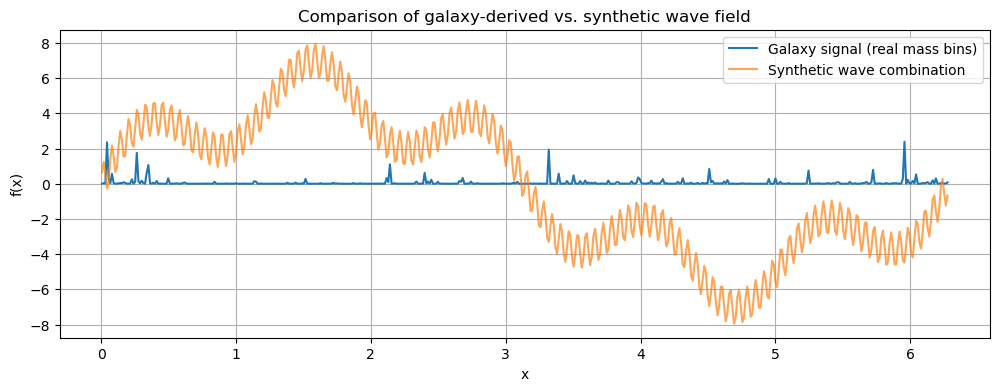

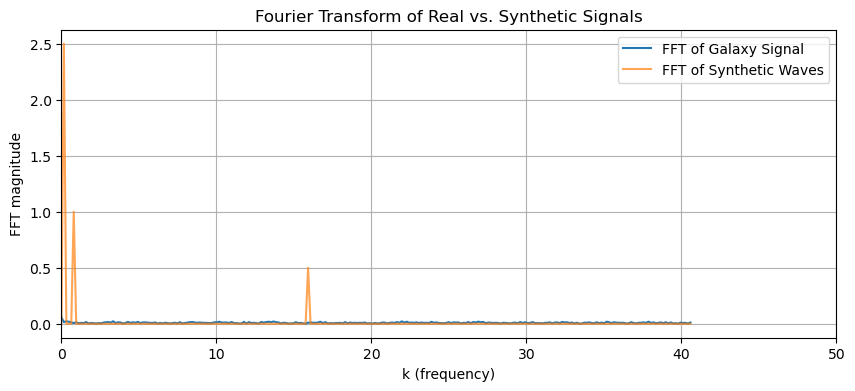

In [11]:
# Load real galaxy positions and masses
px = np.array([g['px'] for g in galaxies])     # extract 'px' from each galaxy dict
mass = np.array([g['mass'][0] for g in galaxies])  # assuming 'mass' is a list like [value]


# Define 1D x-axis domain
nbins = 512
x_min, x_max = 0, 2*np.pi
bins = np.linspace(x_min, x_max, nbins+1)
x = 0.5 * (bins[:-1] + bins[1:])  # bin centers

# --- Project mass into 1D space by binning px positions ---
field_real = np.histogram(px % (2*np.pi), bins=bins, weights=mass)[0]  # modulo to wrap into domain

# --- Build synthetic wave (for comparison) ---
klong = 1
along = 5
long_wave = along * np.sin(klong * x)

kshort = 100
ashort = 1
short_wave = ashort * np.sin(kshort * x)

kmid = 5
amid = 2
mid_wave = amid * np.sin(kmid * x)

field_synthetic = long_wave + short_wave + mid_wave

# --- FFT both ---
fft_real = np.abs(np.fft.fft(field_real)) / nbins
fft_synthetic = np.abs(np.fft.fft(field_synthetic)) / nbins
k_vals = np.fft.fftfreq(nbins, d=(x[1]-x[0]))

# Only keep positive frequencies
mask = k_vals >= 0
k = k_vals[mask]
fft_real = fft_real[mask]
fft_synthetic = fft_synthetic[mask]

# --- Plot spatial fields ---
plt.figure(figsize=(12, 4))
plt.plot(x, field_real, label='Galaxy signal (real mass bins)')
plt.plot(x, field_synthetic, label='Synthetic wave combination', alpha=0.7)
plt.xlabel("x")
plt.ylabel("f(x)")
plt.legend()
plt.title("Comparison of galaxy-derived vs. synthetic wave field")
plt.grid(True)
plt.show()

# --- Plot FFTs ---
plt.figure(figsize=(10, 4))
plt.plot(k, fft_real, label='FFT of Galaxy Signal')
plt.plot(k, fft_synthetic, label='FFT of Synthetic Waves', alpha=0.7)
plt.xlabel("k (frequency)")
plt.ylabel("FFT magnitude")
plt.title("Fourier Transform of Real vs. Synthetic Signals")
plt.legend()
plt.grid(True)
plt.xlim(0, 50)  # show dominant frequencies
plt.show()


The top plot compares a galaxy-derived signal (based on real mass bins) with a synthetic wave combination, showing differences in structure and smoothness. The bottom plot displays their Fourier transforms, where the synthetic signal shows distinct frequency peaks, while the galaxy signal has a more complex, noisy spectrum—highlighting the richer, non-periodic features in the real data.

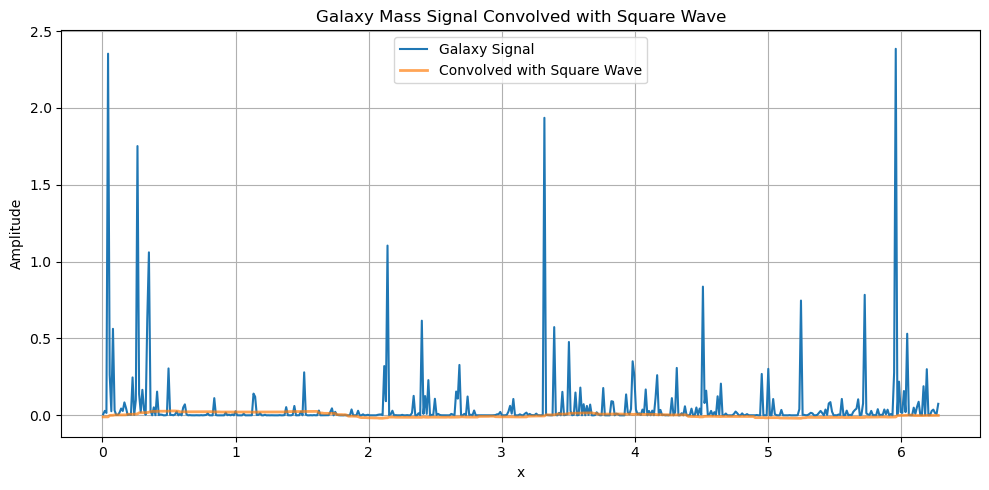

In [13]:
# Step 1: Galaxy signal along x (same as before)
nbins = 512
x_min, x_max = 0, 2*np.pi
bins = np.linspace(x_min, x_max, nbins + 1)
x_centers = 0.5 * (bins[:-1] + bins[1:])

# Extract from galaxy list
px = np.array([g['px'] for g in galaxies])
mass = np.array([g['mass'][0] for g in galaxies])

# Project to 1D signal: total mass per position bin
galaxy_signal = np.histogram(px % (2*np.pi), bins=bins, weights=mass)[0]

# Step 2: Square wave function to use as kernel (match resolution)
N = nbins
x = np.linspace(0, 2*np.pi, N, endpoint=False)
square_wave = square(2 * x, duty=0.5)

# Optional: normalize the kernel
square_wave_normalized = square_wave / np.sum(np.abs(square_wave))

# Step 3: Convolve the square wave with galaxy signal
convolved_signal = convolve(galaxy_signal, square_wave_normalized, mode='same')

# Step 4: Plot results
plt.figure(figsize=(10, 5))
plt.plot(x_centers, galaxy_signal, label='Galaxy Signal')
plt.plot(x_centers, convolved_signal, label='Convolved with Square Wave', linewidth=2, alpha=0.7)
plt.xlabel("x")
plt.ylabel("Amplitude")
plt.title("Galaxy Mass Signal Convolved with Square Wave")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


This plot compares the original galaxy mass signal (blue) with its version convolved using a square wave kernel (orange). The convolution smooths out sharp spikes in the original signal, highlighting broader trends while suppressing high-frequency fluctuations—effectively acting as a low-pass filter.

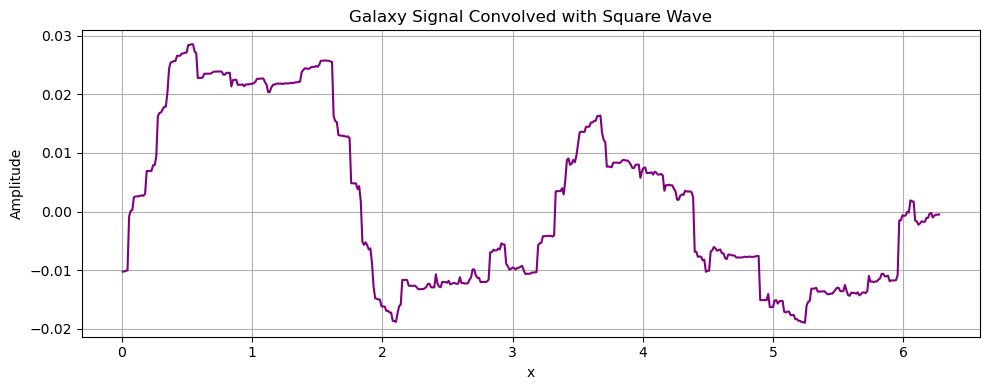

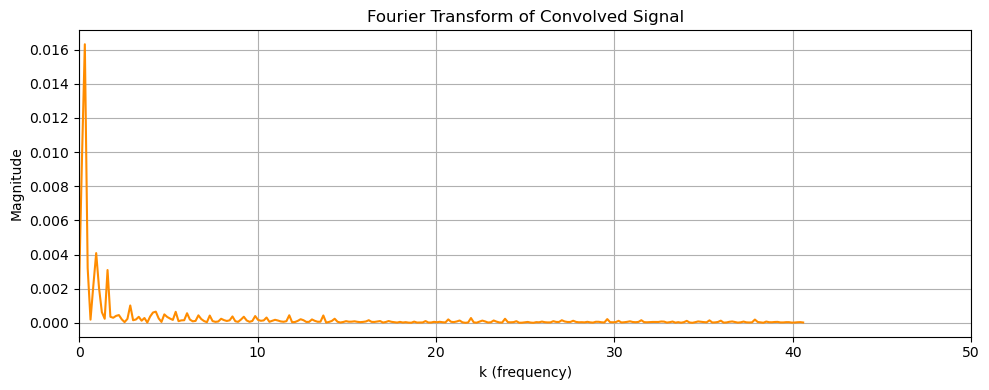

In [22]:
# ---- Step 1: Galaxy signal from positions and masses ----
nbins = 512
x_min, x_max = 0, 2 * np.pi
bins = np.linspace(x_min, x_max, nbins + 1)
x_centers = 0.5 * (bins[:-1] + bins[1:])

px = np.array([g['px'] for g in galaxies])
mass = np.array([g['mass'][0] for g in galaxies])
galaxy_signal = np.histogram(px % (2*np.pi), bins=bins, weights=mass)[0]

# ---- Step 2: Create square wave kernel ----
N = nbins
S = 2 * np.pi
T = S / N
x = np.linspace(0, 2 * np.pi, N, endpoint=False)
square_wave = square(2 * x, duty=0.5)
square_wave_norm = square_wave / np.sum(np.abs(square_wave))

# ---- Step 3: Convolve ----
convolved_signal = convolve(galaxy_signal, square_wave_norm, mode='same')

# ---- Step 4: FFT of the convolved signal ----
fft_conv = fft(convolved_signal)
k = fftfreq(N, T)[:N // 2]
fft_mag = 2.0 / N * np.abs(fft_conv[:N // 2])

# ---- Step 5: Plot the convolved signal ----
plt.figure(figsize=(10, 4))
plt.plot(x_centers, convolved_signal, label='Convolved Signal', color='purple')
plt.xlabel('x')
plt.ylabel('Amplitude')
plt.title('Galaxy Signal Convolved with Square Wave')
plt.grid(True)
plt.tight_layout()
plt.show()

# ---- Step 6: Plot the FFT of the convolved signal ----
plt.figure(figsize=(10, 4))
plt.plot(k, fft_mag, label='FFT of Convolved Signal', color='darkorange')
plt.xlabel('k (frequency)')
plt.ylabel('Magnitude')
plt.title('Fourier Transform of Convolved Signal')
plt.xlim(0, 50)
plt.grid(True)
plt.tight_layout()
plt.show()


The top plot shows the galaxy mass signal after convolution with a square wave, resulting in a smoothed, piecewise-constant profile that emphasizes broader features while removing sharp spikes. The bottom plot displays the Fourier transform of this convolved signal, where high-frequency components are significantly suppressed—confirming the low-pass filtering effect of the square wave convolution.

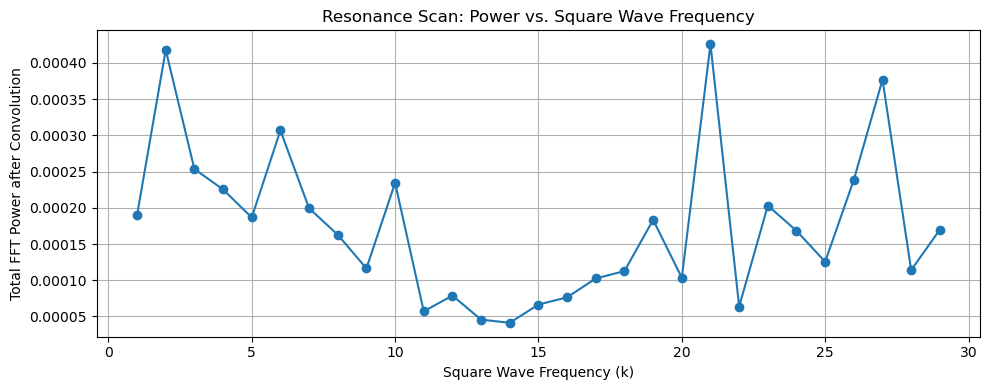

In [24]:
# -- Setup galaxy signal --
nbins = 512
x = np.linspace(0, 2*np.pi, nbins, endpoint=False)
bins = np.linspace(0, 2*np.pi, nbins + 1)
x_centers = 0.5 * (bins[:-1] + bins[1:])

px = np.array([g['px'] for g in galaxies])
mass = np.array([g['mass'][0] for g in galaxies])
galaxy_signal = np.histogram(px % (2*np.pi), bins=bins, weights=mass)[0]

# -- Scan over square wave frequencies --
freqs = np.arange(1, 30, 1)  # try k = 1 to 29
total_power = []

for kf in freqs:
    # Build square wave kernel
    kernel = square(kf * x, duty=0.5)
    kernel /= np.sum(np.abs(kernel))  # normalize

    # Convolve
    conv = convolve(galaxy_signal, kernel, mode='same')

    # FFT of convolved signal
    fft_conv = fft(conv)
    mag = 2.0 / nbins * np.abs(fft_conv[:nbins // 2])

    # Total signal power (sum of squared magnitudes)
    power = np.sum(mag**2)
    total_power.append(power)

# -- Plot power vs. square wave frequency --
plt.figure(figsize=(10, 4))
plt.plot(freqs, total_power, marker='o')
plt.xlabel("Square Wave Frequency (k)")
plt.ylabel("Total FFT Power after Convolution")
plt.title("Resonance Scan: Power vs. Square Wave Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()


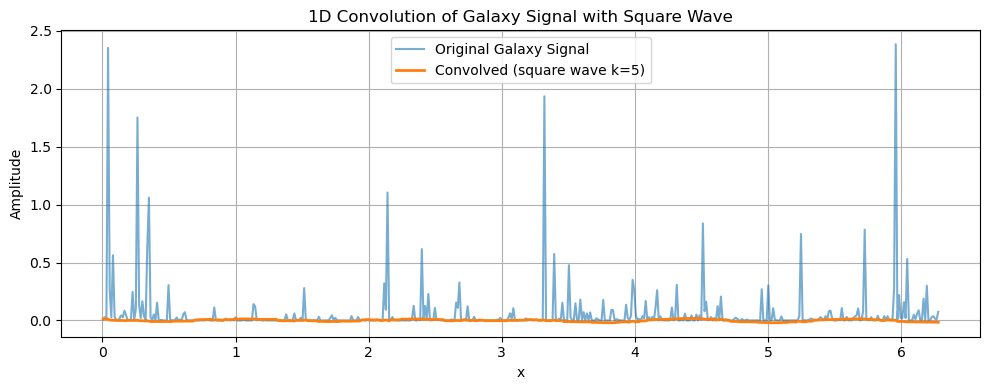

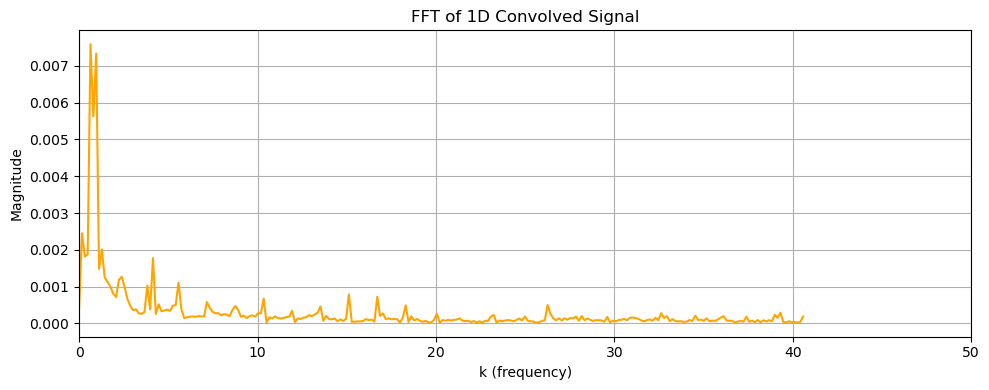

In [28]:
# --- Step 1: Create 1D galaxy signal ---
nbins = 512
x = np.linspace(0, 2*np.pi, nbins, endpoint=False)
bins = np.linspace(0, 2*np.pi, nbins + 1)
x_centers = 0.5 * (bins[:-1] + bins[1:])

px = np.array([g['px'] for g in galaxies])
mass = np.array([g['mass'][0] for g in galaxies])
galaxy_signal = np.histogram(px % (2*np.pi), bins=bins, weights=mass)[0]

# --- Step 2: Create convolution kernel (e.g., square wave) ---
kf = 5  # frequency
kernel = square(kf * x, duty=0.5)
kernel /= np.sum(np.abs(kernel))  # normalize for consistent amplitude

# --- Step 3: Convolve galaxy signal with kernel ---
conv_signal = convolve(galaxy_signal, kernel, mode='same')

# --- Step 4: FFT of convolved signal ---
N = len(conv_signal)
T = 2 * np.pi / N  # spacing
fft_conv = fft(conv_signal)
k_vals = fftfreq(N, T)[:N // 2]
fft_mag = 2.0 / N * np.abs(fft_conv[:N // 2])

# --- Plot original + convolved signal ---
plt.figure(figsize=(10, 4))
plt.plot(x_centers, galaxy_signal, label='Original Galaxy Signal', alpha=0.6)
plt.plot(x_centers, conv_signal, label=f'Convolved (square wave k={kf})', linewidth=2)
plt.xlabel("x")
plt.ylabel("Amplitude")
plt.title("1D Convolution of Galaxy Signal with Square Wave")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# --- Plot FFT of convolved signal ---
plt.figure(figsize=(10, 4))
plt.plot(k_vals, fft_mag, color='orange')
plt.xlabel("k (frequency)")
plt.ylabel("Magnitude")
plt.title("FFT of 1D Convolved Signal")
plt.xlim(0, 50)
plt.grid(True)
plt.tight_layout()
plt.show()


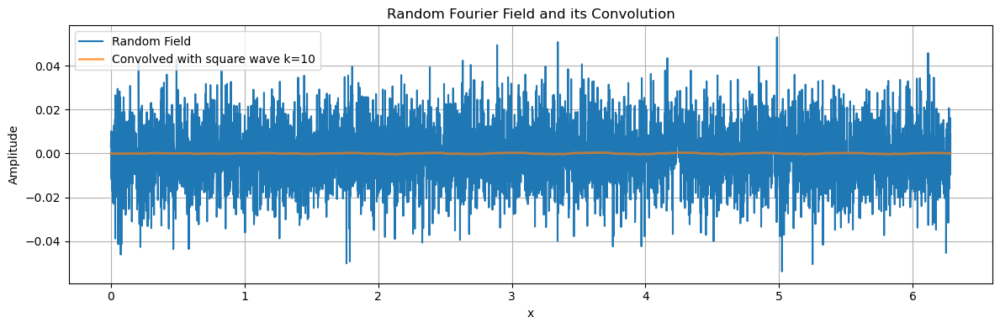

In [30]:
# Step 1: Create random complex Fourier spectrum
N1 = 500
random_spec = np.random.normal(0, 1.0, size=N1)
random_speci = np.random.normal(0, 1.0, size=N1)
random_fourier = random_spec + 1j * random_speci

# Step 2: Inverse FFT to get real-space signal
random_field = np.real(ifft(random_fourier))

# Step 3: Create a square wave kernel for convolution
x = np.linspace(0, 2*np.pi, N1, endpoint=False)
kf = 10  # try different frequencies
kernel = square(kf * x, duty=0.5)
kernel /= np.sum(np.abs(kernel))  # normalize

# Step 4: Convolve random field with square wave
conv_field = convolve(random_field, kernel, mode='same')

# Step 5: Plot original and convolved signals
plt.figure(figsize=(12, 4))
plt.plot(x, random_field, label='Random Field')
plt.plot(x, conv_field, label=f'Convolved with square wave k={kf}', alpha=0.7, linewidth=2)
plt.xlabel("x")
plt.ylabel("Amplitude")
plt.title("Random Fourier Field and its Convolution")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


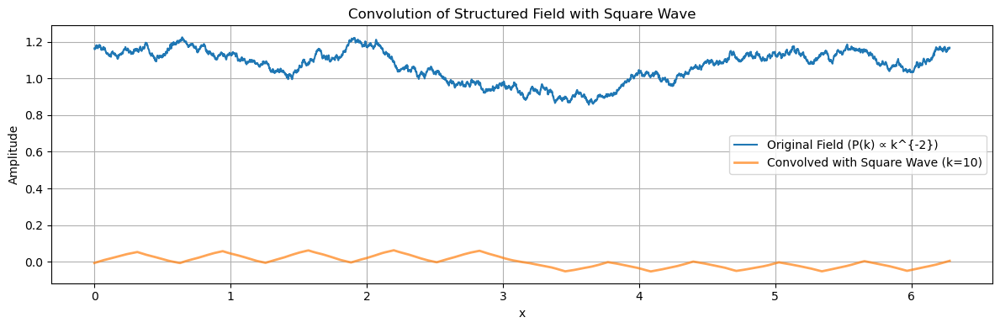

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve, square
from numpy.fft import ifft

# --- Step 1: Set parameters ---
N1 = 5000
kk = np.linspace(0.0001, 10, N1)
x = np.linspace(0, 2*np.pi, N1, endpoint=False)

# --- Step 2: Power spectrum P(k) ∝ k^a ---
a = -2
logP = a * np.log10(kk)
Pk = 10 ** logP
sqrt_Pk = np.sqrt(Pk)

# --- Step 3: Random normalized phase spectrum ---
random_real = np.random.normal(0, 1.0, N1)
random_imag = np.random.normal(0, 1.0, N1)
random_phase = random_real + 1j * random_imag
random_phase /= np.abs(random_phase)

# --- Step 4: Generate random field with structured P(k) ---
fourier_coeffs = random_phase * sqrt_Pk
random_field = np.real(ifft(fourier_coeffs))

# --- Step 5: Create square wave kernel ---
kf = 10  # Frequency of square wave
square_kernel = square(kf * x, duty=0.5)
square_kernel /= np.sum(np.abs(square_kernel))  # normalize energy

# --- Step 6: Convolve field with square wave kernel ---
conv_field = convolve(random_field, square_kernel, mode='same')

# --- Step 7: Plot original and convolved fields ---
plt.figure(figsize=(12, 4))
plt.plot(x, random_field, label='Original Field (P(k) ∝ k^{-2})')
plt.plot(x, conv_field, label=f'Convolved with Square Wave (k={kf})', linewidth=2, alpha=0.7)
plt.xlabel("x")
plt.ylabel("Amplitude")
plt.title("Convolution of Structured Field with Square Wave")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


###### 

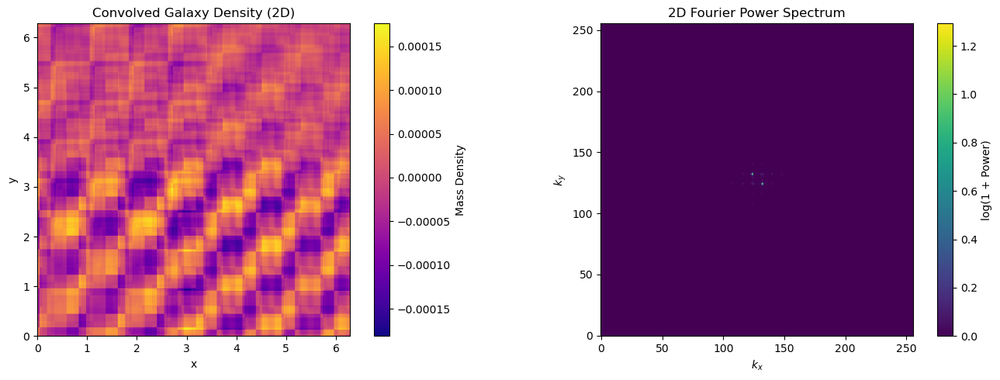

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import square, fftconvolve
from numpy.fft import fft2, fftshift

# --- Step 1: Load and bin galaxy data using histogram2d ---
grid_size = 256
domain_size = 2 * np.pi

px = np.array([g['px'] for g in galaxies])
py = np.array([g['py'] for g in galaxies])
mass = np.array([g['mass'][0] for g in galaxies])

# Efficient 2D binning: y first, then x
density_2d, _, _ = np.histogram2d(
    py % domain_size, px % domain_size,
    bins=grid_size,
    range=[[0, domain_size], [0, domain_size]],
    weights=mass
)

# --- Step 2: Create 2D square wave kernel ---
x = np.linspace(0, domain_size, grid_size, endpoint=False)
X, Y = np.meshgrid(x, x)
kf = 4  # frequency of square wave
square_wave_2d = square(kf * X, duty=0.5) * square(kf * Y, duty=0.5)
kernel_2d = square_wave_2d / np.sum(np.abs(square_wave_2d))  # normalize

# --- Step 3: Fast FFT-based convolution ---
convolved_2d = fftconvolve(density_2d, kernel_2d, mode='same')

# --- Step 4: 2D FFT and power spectrum ---
fft_result = fftshift(fft2(convolved_2d))
power_2d = np.abs(fft_result)**2

# --- Step 5: Plot ---
plt.figure(figsize=(14, 5))

# Real space (convolved signal)
plt.subplot(1, 2, 1)
plt.imshow(convolved_2d, origin='lower', cmap='plasma',
           extent=[0, domain_size, 0, domain_size])
plt.title("Convolved Galaxy Density (2D)")
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar(label='Mass Density')

# Frequency space (log power spectrum)
plt.subplot(1, 2, 2)
plt.imshow(np.log1p(power_2d), origin='lower', cmap='viridis')
plt.title("2D Fourier Power Spectrum")
plt.xlabel('$k_x$')
plt.ylabel('$k_y$')
plt.colorbar(label='log(1 + Power)')

plt.tight_layout()
plt.show()


Scanning frequencies: 100%|██████████| 30/30 [00:00<00:00, 250.91it/s]


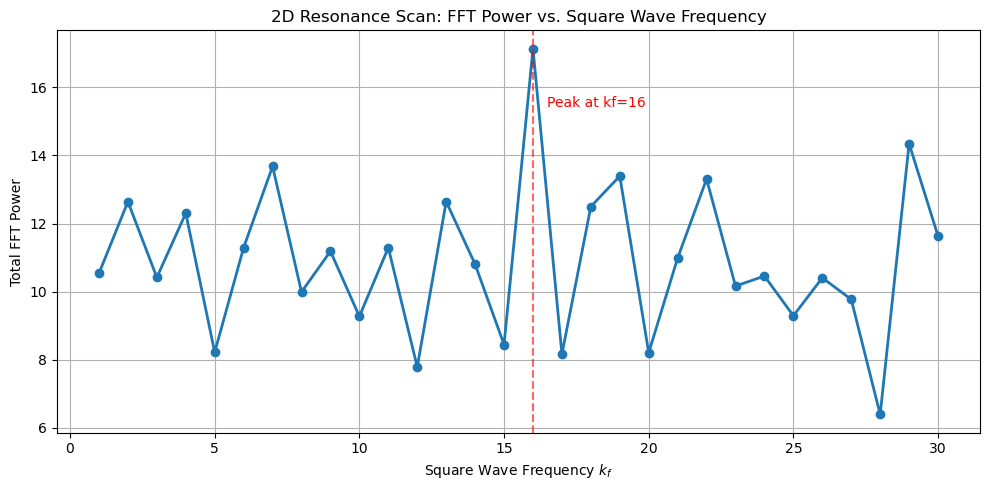

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import square, fftconvolve
from numpy.fft import fft2
from tqdm import tqdm  # optional for progress bar

# --- Step 1: Setup with smaller grid ---
grid_size = 128
domain_size = 2 * np.pi

# Get galaxy data
px = np.array([g['px'] for g in galaxies])
py = np.array([g['py'] for g in galaxies])
mass = np.array([g['mass'][0] for g in galaxies])

# Efficient 2D binning with numpy
density_2d, _, _ = np.histogram2d(
    py % domain_size, px % domain_size,
    bins=grid_size,
    range=[[0, domain_size], [0, domain_size]],
    weights=mass
)

# Prepare meshgrid once for all kf
x = np.linspace(0, domain_size, grid_size, endpoint=False)
X, Y = np.meshgrid(x, x)

# --- Step 2: Frequency scan ---
freqs = np.arange(1, 31)  # test kf from 1 to 30
power_values = []

for kf in tqdm(freqs, desc="Scanning frequencies"):
    # Fast separable square wave kernel
    kernel = square(kf * X, duty=0.5) * square(kf * Y, duty=0.5)
    kernel /= np.sum(np.abs(kernel))  # normalize

    # Fast convolution and FFT
    conv_result = fftconvolve(density_2d, kernel, mode='same')
    fft_result = fft2(conv_result)
    total_power = np.sum(np.abs(fft_result)**2)

    power_values.append(total_power)

# --- Step 3: Plot results ---
plt.figure(figsize=(10, 5))
plt.plot(freqs, power_values, marker='o', linewidth=2)
plt.xlabel("Square Wave Frequency $k_f$")
plt.ylabel("Total FFT Power")
plt.title("2D Resonance Scan: FFT Power vs. Square Wave Frequency")
plt.grid(True)

# Optional: annotate peak
kf_peak = freqs[np.argmax(power_values)]
plt.axvline(kf_peak, color='r', linestyle='--', alpha=0.6)
plt.text(kf_peak + 0.5, max(power_values)*0.9, f"Peak at kf={kf_peak}", color='red')

plt.tight_layout()
plt.show()


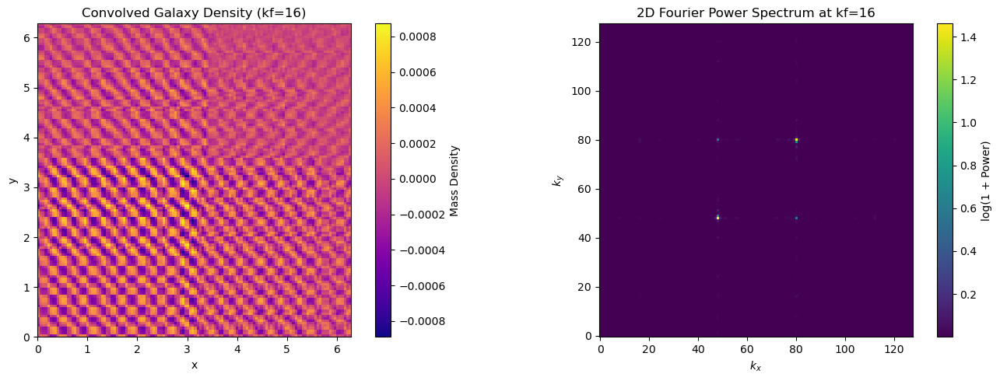

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import square, fftconvolve
from numpy.fft import fft2, fftshift

# --- Setup ---
kf = 16
grid_size = 128
domain_size = 2 * np.pi

# Galaxy data (assumes px, py, mass already loaded)
density_2d, _, _ = np.histogram2d(
    py % domain_size, px % domain_size,
    bins=grid_size,
    range=[[0, domain_size], [0, domain_size]],
    weights=mass
)

# --- Kernel for kf=16 ---
x = np.linspace(0, domain_size, grid_size, endpoint=False)
X, Y = np.meshgrid(x, x)
kernel = square(kf * X, duty=0.5) * square(kf * Y, duty=0.5)
kernel /= np.sum(np.abs(kernel))  # normalize

# --- Convolve ---
convolved = fftconvolve(density_2d, kernel, mode='same')

# --- FFT ---
fft_result = fftshift(fft2(convolved))
power_2d = np.abs(fft_result)**2

# --- Plot Real-Space Convolved Field ---
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.imshow(convolved, origin='lower', cmap='plasma',
           extent=[0, domain_size, 0, domain_size])
plt.title(f"Convolved Galaxy Density (kf={kf})")
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar(label='Mass Density')

# --- Plot 2D FFT Power Spectrum ---
plt.subplot(1, 2, 2)
plt.imshow(np.log1p(power_2d), origin='lower', cmap='viridis')
plt.title(f"2D Fourier Power Spectrum at kf={kf}")
plt.xlabel('$k_x$')
plt.ylabel('$k_y$')
plt.colorbar(label='log(1 + Power)')

plt.tight_layout()
plt.show()


The left panel displays a 2D convolved galaxy density map using a filter frequency 𝑘𝑓=16, showing a checkerboard-like pattern of oscillating mass densities. The right panel shows the corresponding 2D Fourier power spectrum, revealing dominant frequency components at 𝑘𝑥=𝑘𝑦=16, consistent with the convolution scale, and confirming the presence of periodic structures in the filtered density field.

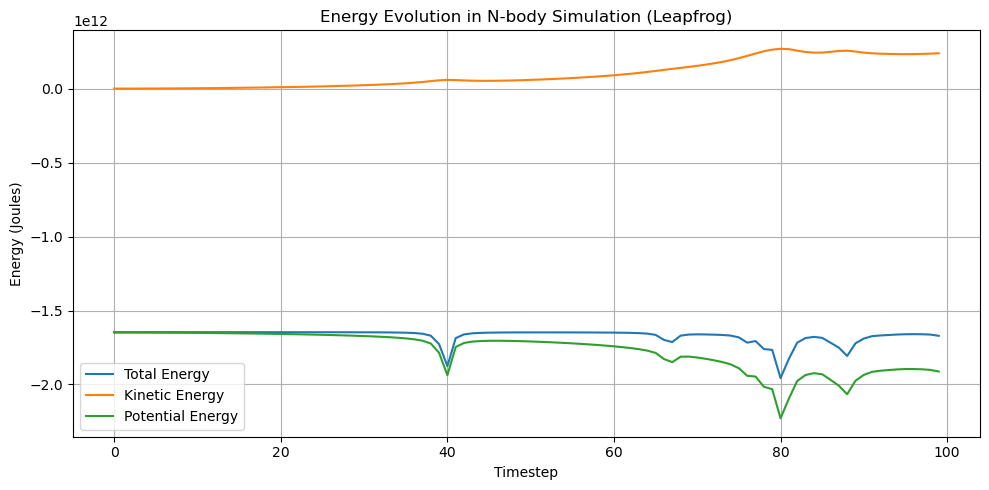

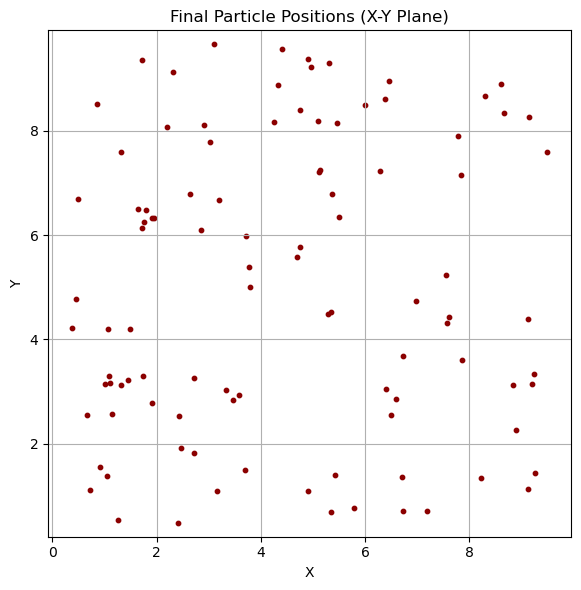

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.constants import G as G_phys  # physical gravitational constant

# --- Gravitational Acceleration ---
def getAcc(pos, mass, G, softening, t, a=1.0):
    x, y, z = pos[:, 0:1], pos[:, 1:2], pos[:, 2:3]
    dx, dy, dz = x.T - x, y.T - y, z.T - z
    inv_r3 = dx**2 + dy**2 + dz**2 + softening**2
    inv_r3[inv_r3 > 0] = inv_r3[inv_r3 > 0]**(-1.5)
    ax = G * a**(-1) * (dx * inv_r3) @ mass
    ay = G * a**(-1) * (dy * inv_r3) @ mass
    az = G * a**(-1) * (dz * inv_r3) @ mass
    return np.hstack((ax, ay, az))

# --- Energy Calculation ---
def getEnergy(pos, vel, mass, G):
    KE = 0.5 * np.sum(mass * np.sum(vel**2, axis=1, keepdims=True))
    x, y, z = pos[:, 0:1], pos[:, 1:2], pos[:, 2:3]
    dx, dy, dz = x.T - x, y.T - y, z.T - z
    inv_r = np.sqrt(dx**2 + dy**2 + dz**2)
    inv_r[inv_r > 0] = 1.0 / inv_r[inv_r > 0]
    PE = G * np.sum(np.triu(-(mass * mass.T) * inv_r, 1))
    return KE, PE

# --- Initialize Galaxy Particles ---
def initialize_from_galaxies(galaxies, max_particles=100):
    pos = np.array([[g['px'], g['py'], g['pz']] for g in galaxies if 'mass' in g])
    vel = np.array([[g['vx'], g['vy'], g['vz']] for g in galaxies if 'mass' in g])
    mass = np.array([[g['mass'][0]] for g in galaxies if 'mass' in g])
    if len(pos) > max_particles:
        idx = np.random.choice(len(pos), size=max_particles, replace=False)
        pos, vel, mass = pos[idx], vel[idx], mass[idx]
    return pos, vel, mass

# --- Leapfrog Integration Loop ---
def run_simulation(pos, vel, mass, G=1.0, softening=0.1, dt=0.01, n_steps=100):
    a = getAcc(pos, mass, G, softening, t=1.0)
    energy_history = []
    positions = []
    for step in range(n_steps):
        vel += 0.5 * dt * a
        pos += dt * vel
        a = getAcc(pos, mass, G, softening, t=1.0)
        vel += 0.5 * dt * a
        KE, PE = getEnergy(pos, vel, mass, G)
        energy_history.append((KE + PE, KE, PE))
        positions.append(pos.copy())
    return np.array(energy_history), np.array(positions)

# --- Example Synthetic Galaxy Data ---
from random import random
galaxies = [{
    'px': 10 * random(), 'py': 10 * random(), 'pz': 10 * random(),
    'vx': 0.1 * random(), 'vy': 0.1 * random(), 'vz': 0.1 * random(),
    'mass': [1.0e10 * random()]
} for _ in range(200)]

# --- Run Simulation ---
pos, vel, mass = initialize_from_galaxies(galaxies, max_particles=100)
energy_history, positions = run_simulation(pos, vel, mass, G=G_phys)

# --- Plot Energy Evolution ---
plt.figure(figsize=(10, 5))
plt.plot(energy_history[:, 0], label='Total Energy')
plt.plot(energy_history[:, 1], label='Kinetic Energy')
plt.plot(energy_history[:, 2], label='Potential Energy')
plt.xlabel("Timestep")
plt.ylabel("Energy (Joules)")
plt.title("Energy Evolution in N-body Simulation (Leapfrog)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Plot Final Particle Positions (XY) ---
final_pos = positions[-1]
plt.figure(figsize=(6, 6))
plt.scatter(final_pos[:, 0], final_pos[:, 1], c='darkred', s=10)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("Final Particle Positions (X-Y Plane)")
plt.grid(True)
plt.axis('equal')
plt.tight_layout()
plt.show()


The top plot shows the energy evolution in an N-body simulation using the leapfrog integration method, tracking kinetic, potential, and total energy over 100 timesteps. Despite minor fluctuations—especially during close interactions—the total energy remains relatively stable, indicating good energy conservation. The bottom plot displays the final positions of particles in the XY plane, showing how they spatially evolved over the simulation.

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.constants import G as G_phys

# --- Gravitational Acceleration ---
def getAcc(pos, mass, G, softening, t, a=1.0):
    x, y, z = pos[:, 0:1], pos[:, 1:2], pos[:, 2:3]
    dx, dy, dz = x.T - x, y.T - y, z.T - z
    inv_r3 = dx**2 + dy**2 + dz**2 + softening**2
    inv_r3[inv_r3 > 0] = inv_r3[inv_r3 > 0]**(-1.5)
    ax = G * a**(-1) * (dx * inv_r3) @ mass
    ay = G * a**(-1) * (dy * inv_r3) @ mass
    az = G * a**(-1) * (dz * inv_r3) @ mass
    return np.hstack((ax, ay, az))

# --- Energy Calculation ---
def getEnergy(pos, vel, mass, G):
    KE = 0.5 * np.sum(mass * np.sum(vel**2, axis=1, keepdims=True))
    x, y, z = pos[:, 0:1], pos[:, 1:2], pos[:, 2:3]
    dx, dy, dz = x.T - x, y.T - y, z.T - z
    inv_r = np.sqrt(dx**2 + dy**2 + dz**2)
    inv_r[inv_r > 0] = 1.0 / inv_r[inv_r > 0]
    PE = G * np.sum(np.triu(-(mass * mass.T) * inv_r, 1))
    return KE, PE, 0.0, 0.0  # radial and orbital placeholders

# --- Galaxy-based Initializer ---
def initialize_from_galaxies(galaxies, max_particles=100):
    pos = np.array([[g['px'], g['py'], g['pz']] for g in galaxies if 'mass' in g])
    vel = np.array([[g['vx'], g['vy'], g['vz']] for g in galaxies if 'mass' in g])
    mass = np.array([[g['mass'][0]] for g in galaxies if 'mass' in g])
    if len(pos) > max_particles:
        idx = np.random.choice(len(pos), size=max_particles, replace=False)
        pos, vel, mass = pos[idx], vel[idx], mass[idx]
    return pos, vel, mass

# --- Main Simulation Function ---
def main(galaxies):
    N = 100
    t = 0
    tEnd = 10.0
    dt = 0.01
    softening = 0.1
    G = G_phys
    plotRealTime = True

    # Set output path
    directory = "MyNbodyRun_N{}part".format(N)
    parent_dir = "./simulation_output/"
    path = os.path.join(parent_dir, directory)
    os.makedirs(path, exist_ok=True)

    # Load initial conditions from galaxy data
    pos, vel, mass = initialize_from_galaxies(galaxies, max_particles=N)
    acc = getAcc(pos, mass, G, softening, t)
    KE, PE, KE_rad, KE_orb = getEnergy(pos, vel, mass, G)

    Nt = int(np.ceil(tEnd / dt))
    pos_save = np.zeros((N, 3, Nt + 1))
    pos_save[:, :, 0] = pos
    KE_save = np.zeros(Nt + 1)
    PE_save = np.zeros(Nt + 1)
    KE_save[0], PE_save[0] = KE, PE
    t_all = np.arange(Nt + 1) * dt

    fig = plt.figure(figsize=(4, 5), dpi=80)
    grid = plt.GridSpec(3, 1, wspace=0.0, hspace=0.3)
    ax1 = plt.subplot(grid[0:2, 0])
    ax2 = plt.subplot(grid[2, 0])

    for i in range(Nt):
        vel += acc * dt / 2.0
        pos += vel * dt
        acc = getAcc(pos, mass, G, softening, t)
        vel += acc * dt / 2.0
        t += dt
        KE, PE, _, _ = getEnergy(pos, vel, mass, G)
        pos_save[:, :, i + 1] = pos
        KE_save[i + 1], PE_save[i + 1] = KE, PE

        if plotRealTime or (i == Nt - 1):
            plt.sca(ax1)
            plt.cla()
            xx = pos_save[:, 0, max(i - 50, 0):i + 1]
            yy = pos_save[:, 1, max(i - 50, 0):i + 1]
            plt.scatter(xx, yy, s=1, color=[.7, .7, 1])
            plt.scatter(pos[:, 0], pos[:, 1], s=10, color='red')
            ax1.set(xlim=(-2, 2), ylim=(-2, 2))
            ax1.set_aspect('equal', 'box')
            ax1.set_xticks([-2, -1, 0, 1, 2])
            ax1.set_yticks([-2, -1, 0, 1, 2])

            plt.sca(ax2)
            plt.cla()
            ax2.plot(t_all, KE_save, color='red', label='KE')
            ax2.plot(t_all, PE_save, color='blue', label='PE')
            ax2.plot(t_all, KE_save + PE_save, color='black', label='Etot')
            ax2.legend()
            ax2.set(xlim=(0, tEnd), ylim=(min(PE_save) * 1.1, max(KE_save) * 1.1))
            ax2.set_aspect(0.005)
            plt.sca(ax2)
            plt.xlabel('time')
            plt.ylabel('energy')
            plt.sca(ax1)
            plt.xlabel('x')
            plt.ylabel('y')
            plt.pause(0.001)

    plt.show()
    return 0


In [18]:
import plotly.graph_objects as go
import numpy as np

def plot_3d_orbits(positions, step=-1):
    """
    Plot 3D particle positions and optional trails using Plotly.
    positions: numpy array of shape (N, 3, T) or (N, 3)
    step: which timestep to plot (-1 for final)
    """
    if positions.ndim == 3:
        pos = positions[:, :, step]
        trails = True
    else:
        pos = positions
        trails = False

    fig = go.Figure()

    # Plot particles
    fig.add_trace(go.Scatter3d(
        x=pos[:, 0], y=pos[:, 1], z=pos[:, 2],
        mode='markers',
        marker=dict(size=4, color='red'),
        name='Particles'
    ))

    # Plot trails
    if trails:
        for i in range(min(positions.shape[0], 100)):
            fig.add_trace(go.Scatter3d(
                x=positions[i, 0, :],
                y=positions[i, 1, :],
                z=positions[i, 2, :],
                mode='lines',
                line=dict(width=1, color='rgba(100,100,255,0.3)'),
                showlegend=False
            ))

    fig.update_layout(
        scene=dict(
            xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
            aspectmode='data'
        ),
        title=f"3D N-body Simulation at Step {step if step >= 0 else 'Final'}",
        width=800,
        height=700
    )

    fig.show()


In [28]:
pos -= np.mean(pos, axis=0)         # center around origin
pos /= np.std(pos)                  # scale to unit variance
pos *= 2                            # optionally stretch to [-2, 2] scale


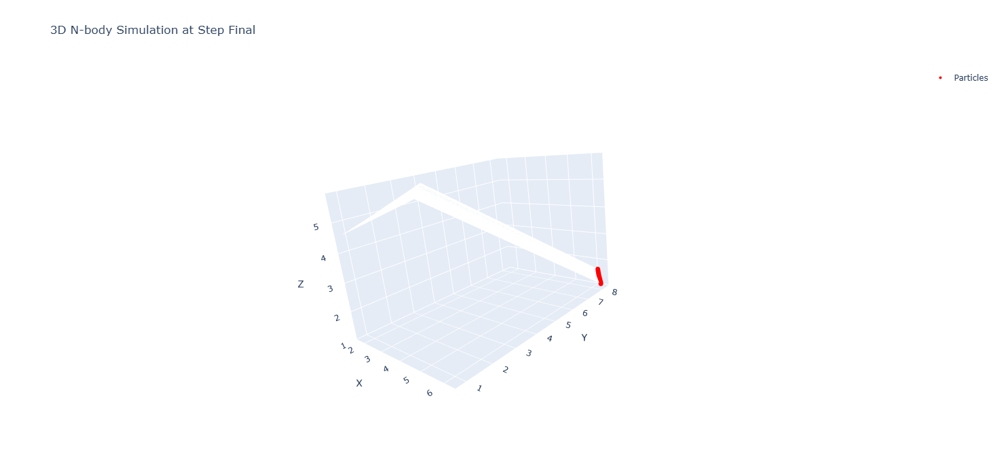

In [20]:
plot_3d_orbits(positions)


In [34]:
import plotly.graph_objects as go
import numpy as np

def animate_3d_nbody(positions, step_stride=2, normalize=True):
    """
    Create a 3D animation of N-body orbits over time.

    Parameters:
    - positions: numpy array of shape (N, 3, T)
    - step_stride: skip steps for speed (default=2)
    - normalize: if True, auto-normalizes coordinates across axes
    """
    N, _, T = positions.shape
    steps = range(0, T, step_stride)

    # Optional: normalize all coordinates to unit box
    if normalize:
        center = np.mean(positions, axis=(0, 2), keepdims=True)  # shape (1, 3, 1)
        std = np.std(positions, axis=(0, 2), keepdims=True)
        std[std == 0] = 1.0  # avoid division by zero
        positions = (positions - center) / std

    # Initial frame
    scatter = go.Scatter3d(
        x=positions[:, 0, 0],
        y=positions[:, 1, 0],
        z=positions[:, 2, 0],
        mode='markers',
        marker=dict(size=4, color='red'),
        name='Particles'
    )

    # All animation frames
    frames = [
        go.Frame(
            data=[go.Scatter3d(
                x=positions[:, 0, t],
                y=positions[:, 1, t],
                z=positions[:, 2, t],
                mode='markers',
                marker=dict(size=4, color='red')
            )],
            name=str(t)
        ) for t in steps
    ]

    # Layout with equal aspect ratio (cube mode)
    layout = go.Layout(
        title="3D N-body Simulation Animation",
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            aspectmode='cube'
        ),
        updatemenus=[dict(
            type='buttons',
            showactive=False,
            buttons=[
                dict(
                    label='Play',
                    method='animate',
                    args=[
                        None,
                        dict(
                            frame=dict(duration=50, redraw=True),
                            fromcurrent=True,
                            mode='immediate'
                        )
                    ]
                )
            ]
        )]
    )

    # Assemble the figure
    fig = go.Figure(
        data=[scatter],
        layout=layout,
        frames=frames
    )

    fig.show()


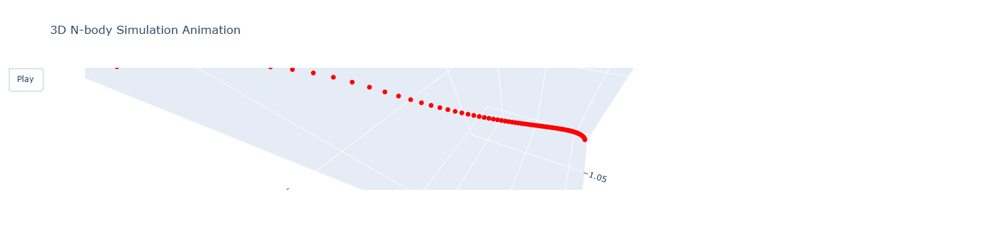

In [36]:
# Assuming positions is your array of shape (N, 3, T)
animate_3d_nbody(positions, step_stride=2)


In [42]:
import plotly.graph_objects as go
import numpy as np
import plotly.express as px


def animate_3d_nbody(positions, step_stride=2, normalize=True):
    """
    Create a 3D animation of N-body orbits over time.

    Parameters:
    - positions: numpy array of shape (N, 3, T)
    - step_stride: skip steps for speed (default=2)
    - normalize: if True, auto-normalizes coordinates across axes
    """
    N, _, T = positions.shape
    steps = range(0, T, step_stride)

    # Optional: normalize all coordinates to unit box
    if normalize:
        center = np.mean(positions, axis=(0, 2), keepdims=True)  # shape (1, 3, 1)
        std = np.std(positions, axis=(0, 2), keepdims=True)
        std[std == 0] = 1.0  # avoid division by zero
        positions = (positions - center) / std

    # Plot multiple timesteps in one frame with different colors
    colors = px.colors.sequential.Viridis[:len(steps)] if len(steps) <= 10 else px.colors.sample_colorscale("Viridis", [i/len(steps) for i in range(len(steps))])

    traces = []
    for i, t in enumerate(steps):
        traces.append(go.Scatter3d(
            x=positions[:, 0, t],
            y=positions[:, 1, t],
            z=positions[:, 2, t],
            mode='markers',
            marker=dict(size=3, color=colors[i % len(colors)]),
            name=f'Timestep {t}'
        ))

    fig = go.Figure(
        data=traces,
        layout=go.Layout(
            title="3D N-body Particle Positions Across Time",
            scene=dict(
                xaxis_title='X',
                yaxis_title='Y',
                zaxis_title='Z',
                aspectmode='cube'
            )
        )
    )

    fig.show()


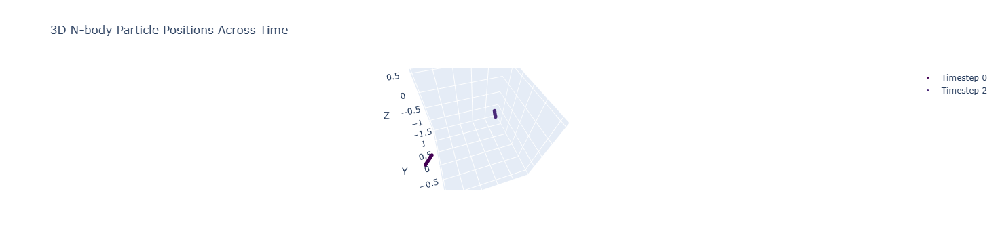

In [43]:
# Assuming positions is your array of shape (N, 3, T)
animate_3d_nbody(positions, step_stride=2)
